In [1]:
# Import Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Import the dataset
hotel = pd.read_excel('hotel_reviews.xlsx')
hotel

,Review,Rating
0,nice hotel expensive parking got good deal sta...,4.0
1,ok nothing special charge diamond member hilto...,2.0
2,nice rooms not 4* experience hotel monaco seat...,3.0
3,"unique, great stay, wonderful time hotel monac...",5.0
4,"great stay great stay, went seahawk game aweso...",5.0
...,...,...
20486,"best kept secret 3rd time staying charm, not 5...",5.0
20487,great location price view hotel great quick pl...,4.0
20488,"ok just looks nice modern outside, desk staff ...",2.0
20489,hotel theft ruined vacation hotel opened sept ...,1.0


## EDA and Sentimental Analysis

In [3]:
hotel.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20491 entries, 0 to 20490
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Review  20491 non-null  object 
 1   Rating  20491 non-null  float64
dtypes: float64(1), object(1)
memory usage: 320.3+ KB


In [4]:
hotel.shape

(20491, 2)

In [5]:
# No duplicates found.
hotel[hotel.duplicated()] 

,Review,Rating


<AxesSubplot:xlabel='Rating', ylabel='count'>

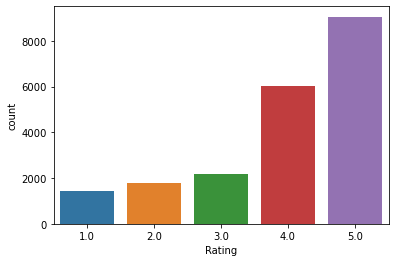

In [6]:
# Plotting the ratings count plot.
sns.countplot(x='Rating', data=hotel)

In [7]:
# Relation between the length of the reviews and ratings
hotel['Review_length'] = hotel['Review'].apply(len)
hotel

,Review,Rating,Review_length
0,nice hotel expensive parking got good deal sta...,4.0,593
1,ok nothing special charge diamond member hilto...,2.0,1689
2,nice rooms not 4* experience hotel monaco seat...,3.0,1427
3,"unique, great stay, wonderful time hotel monac...",5.0,600
4,"great stay great stay, went seahawk game aweso...",5.0,1281
...,...,...,...
20486,"best kept secret 3rd time staying charm, not 5...",5.0,733
20487,great location price view hotel great quick pl...,4.0,306
20488,"ok just looks nice modern outside, desk staff ...",2.0,443
20489,hotel theft ruined vacation hotel opened sept ...,1.0,5557


<AxesSubplot:xlabel='Rating', ylabel='Review_length'>

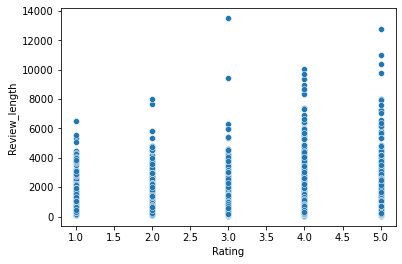

In [8]:
# Plotting Rating vs Review Length scatter plot
sns.scatterplot(x='Rating', y='Review_length', data=hotel)

In [9]:
# Creating a function to divide the reviews into categories - Positive & Negative, based on Ratings.
def rating_analysis(rating):
  if rating <=2:
    return 'Negative'
  else:
    return 'Positive'

# Applying the funtion to the rating column.

hotel['Analysis(Rating)'] = hotel['Rating'].apply(rating_analysis)
hotel

,Review,Rating,Review_length,Analysis(Rating)
0,nice hotel expensive parking got good deal sta...,4.0,593,Positive
1,ok nothing special charge diamond member hilto...,2.0,1689,Negative
2,nice rooms not 4* experience hotel monaco seat...,3.0,1427,Positive
3,"unique, great stay, wonderful time hotel monac...",5.0,600,Positive
4,"great stay great stay, went seahawk game aweso...",5.0,1281,Positive
...,...,...,...,...
20486,"best kept secret 3rd time staying charm, not 5...",5.0,733,Positive
20487,great location price view hotel great quick pl...,4.0,306,Positive
20488,"ok just looks nice modern outside, desk staff ...",2.0,443,Negative
20489,hotel theft ruined vacation hotel opened sept ...,1.0,5557,Negative


In [10]:
# Value counts
hotel['Analysis(Rating)'].value_counts()

Positive    17277
Negative     3214
Name: Analysis(Rating), dtype: int64

In [11]:
pip install textblob

Note: you may need to restart the kernel to use updated packages.


In [12]:
# Importing text blob for sentiment analysis.

from textblob import TextBlob

In [13]:
# Creating a function to get the Subjectivity.

def get_subjectivity(text):
  return TextBlob(text).sentiment.subjectivity

# Creating a function to get the Polarity.

def get_polarity(text):
  return TextBlob(text).sentiment.polarity

# Creating two columns for Subjectivity and Polarity, And applying the functions.

hotel['Subjectivity'] = hotel['Review'].apply(get_subjectivity)
hotel['Polarity'] = hotel['Review'].apply(get_polarity)
hotel

,Review,Rating,Review_length,Analysis(Rating),Subjectivity,Polarity
0,nice hotel expensive parking got good deal sta...,4.0,593,Positive,0.687000,0.208744
1,ok nothing special charge diamond member hilto...,2.0,1689,Negative,0.495009,0.214923
2,nice rooms not 4* experience hotel monaco seat...,3.0,1427,Positive,0.605208,0.294420
3,"unique, great stay, wonderful time hotel monac...",5.0,600,Positive,0.691228,0.504825
4,"great stay great stay, went seahawk game aweso...",5.0,1281,Positive,0.629396,0.384615
...,...,...,...,...,...,...
20486,"best kept secret 3rd time staying charm, not 5...",5.0,733,Positive,0.508586,0.221729
20487,great location price view hotel great quick pl...,4.0,306,Positive,0.622222,0.503704
20488,"ok just looks nice modern outside, desk staff ...",2.0,443,Negative,0.524304,0.171220
20489,hotel theft ruined vacation hotel opened sept ...,1.0,5557,Negative,0.533441,0.122573


In [14]:
# Creating a function to do the analysis and divide the reviews into two categories - Positive & Negative, based on the Polarity.

def get_analysis(score):
  if score < 0:
    return 'Negative'
  else:
    return 'Positive'

# Applying the analysis function to the reviews.

hotel['Analysis(Polarity)'] = hotel['Polarity'].apply(get_analysis)
hotel

,Review,Rating,Review_length,Analysis(Rating),Subjectivity,Polarity,Analysis(Polarity)
0,nice hotel expensive parking got good deal sta...,4.0,593,Positive,0.687000,0.208744,Positive
1,ok nothing special charge diamond member hilto...,2.0,1689,Negative,0.495009,0.214923,Positive
2,nice rooms not 4* experience hotel monaco seat...,3.0,1427,Positive,0.605208,0.294420,Positive
3,"unique, great stay, wonderful time hotel monac...",5.0,600,Positive,0.691228,0.504825,Positive
4,"great stay great stay, went seahawk game aweso...",5.0,1281,Positive,0.629396,0.384615,Positive
...,...,...,...,...,...,...,...
20486,"best kept secret 3rd time staying charm, not 5...",5.0,733,Positive,0.508586,0.221729,Positive
20487,great location price view hotel great quick pl...,4.0,306,Positive,0.622222,0.503704,Positive
20488,"ok just looks nice modern outside, desk staff ...",2.0,443,Negative,0.524304,0.171220,Positive
20489,hotel theft ruined vacation hotel opened sept ...,1.0,5557,Negative,0.533441,0.122573,Positive


C:\Users\hp\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Analysis(Rating)', ylabel='count'>

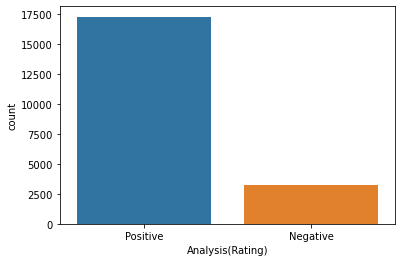

In [15]:
# Plotting Analysis based on ratings.

sns.countplot(hotel['Analysis(Rating)'])

In [16]:
hotel['Analysis(Rating)'].value_counts()

Positive    17277
Negative     3214
Name: Analysis(Rating), dtype: int64

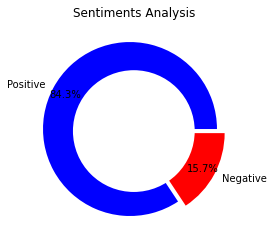

In [17]:
# Setting labels for items in Chart
sentiment_value = ['Positive','Negative']  

# Setting size in Chart based on given values
sentiment_counts = [17277, 3214]

# colors
colors = ['#0000FF','#FF0000']

# explosion
explode = (0.05, 0.05)

# Pie Chart
plt.pie(sentiment_counts, colors=colors, labels=sentiment_value,
        autopct='%1.1f%%', pctdistance=0.85,
        explode=explode)
  
# draw circle
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
fig = plt.gcf()
  
# Adding Circle in Pie chart
fig.gca().add_artist(centre_circle)
  
# Adding Title of chart
plt.title('Sentiments Analysis')
  
# Displaying Chart
plt.show()

C:\Users\hp\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Analysis(Polarity)', ylabel='count'>

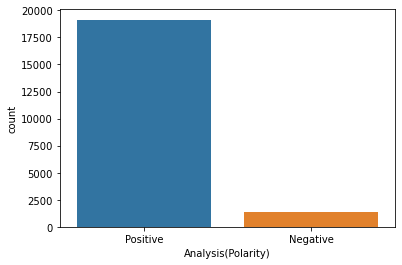

In [18]:
# Plotting Analysis based on polarity of reviews.

sns.countplot(hotel['Analysis(Polarity)'])

C:\Users\hp\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


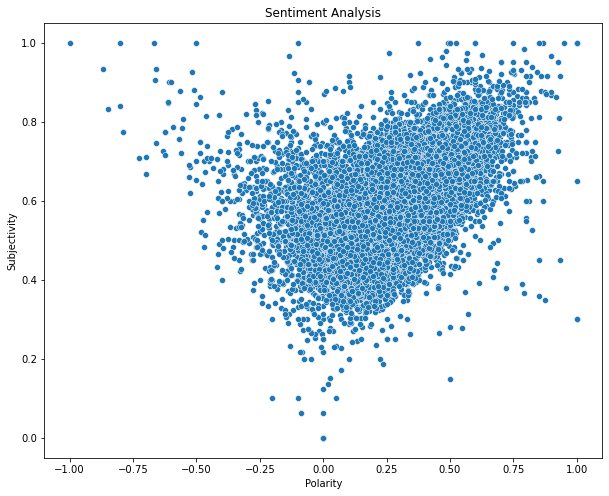

In [19]:
# Plotting the Polarity vs Subjectivity plot.

plt.figure(figsize=(10,8))
sns.scatterplot(hotel['Polarity'], hotel['Subjectivity'])
plt.title('Sentiment Analysis')
plt.xlabel('Polarity')
plt.ylabel('Subjectivity')
plt.show()

In [20]:
hotel

,Review,Rating,Review_length,Analysis(Rating),Subjectivity,Polarity,Analysis(Polarity)
0,nice hotel expensive parking got good deal sta...,4.0,593,Positive,0.687000,0.208744,Positive
1,ok nothing special charge diamond member hilto...,2.0,1689,Negative,0.495009,0.214923,Positive
2,nice rooms not 4* experience hotel monaco seat...,3.0,1427,Positive,0.605208,0.294420,Positive
3,"unique, great stay, wonderful time hotel monac...",5.0,600,Positive,0.691228,0.504825,Positive
4,"great stay great stay, went seahawk game aweso...",5.0,1281,Positive,0.629396,0.384615,Positive
...,...,...,...,...,...,...,...
20486,"best kept secret 3rd time staying charm, not 5...",5.0,733,Positive,0.508586,0.221729,Positive
20487,great location price view hotel great quick pl...,4.0,306,Positive,0.622222,0.503704,Positive
20488,"ok just looks nice modern outside, desk staff ...",2.0,443,Negative,0.524304,0.171220,Positive
20489,hotel theft ruined vacation hotel opened sept ...,1.0,5557,Negative,0.533441,0.122573,Positive


C:\Users\hp\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


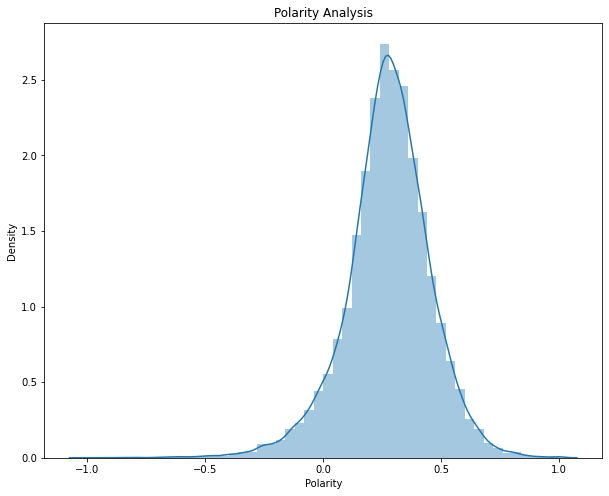

In [21]:
# plotting a density plot for polarity.

plt.figure(figsize=(10,8))
sns.distplot(hotel['Polarity'])
plt.title('Polarity Analysis')
plt.xlabel('Polarity')
plt.show()

### Analyzing Negative Reviews (Based on ratings)

In [22]:
# Converting seperated reviews into single paragraph for using NLTK.

neg_1 = hotel[hotel.apply(lambda x: x['Rating']<3, axis=1)]
neg_1

,Review,Rating,Review_length,Analysis(Rating),Subjectivity,Polarity,Analysis(Polarity)
1,ok nothing special charge diamond member hilto...,2.0,1689,Negative,0.495009,0.214923,Positive
10,"poor value stayed monaco seattle july, nice ho...",2.0,333,Negative,0.575000,0.241667,Positive
15,horrible customer service hotel stay february ...,1.0,1411,Negative,0.573611,0.006510,Positive
16,disappointed say anticipating stay hotel monac...,2.0,1662,Negative,0.577007,0.160411,Positive
24,great location need internally upgrade advanta...,2.0,250,Negative,0.433333,0.259375,Positive
...,...,...,...,...,...,...,...
20484,deceptive staff deceptive desk staff claiming ...,2.0,695,Negative,0.468627,0.025735,Positive
20485,not impressed unfriendly staff checked asked h...,2.0,616,Negative,0.471905,0.026548,Positive
20488,"ok just looks nice modern outside, desk staff ...",2.0,443,Negative,0.524304,0.171220,Positive
20489,hotel theft ruined vacation hotel opened sept ...,1.0,5557,Negative,0.533441,0.122573,Positive


In [23]:
neg_1_str = [x.strip() for x in neg_1.Review]
neg_1_str = ' '.join(neg_1_str)
neg_1_str

"ok nothing special charge diamond member hilton decided chain shot 20th anniversary seattle, start booked suite paid extra website description not, suite bedroom bathroom standard hotel room, took printed reservation desk showed said things like tv couch ect desk clerk told oh mixed suites description kimpton website sorry free breakfast, got kidding, embassy suits sitting room bathroom bedroom unlike kimpton calls suite, 5 day stay offer correct false advertising, send kimpton preferred guest website email asking failure provide suite advertised website reservation description furnished hard copy reservation printout website desk manager duty did not reply solution, send email trip guest survey did not follow email mail, guess tell concerned guest.the staff ranged indifferent not helpful, asked desk good breakfast spots neighborhood hood told no hotels, gee best breakfast spots seattle 1/2 block away convenient hotel does not know exist, arrived late night 11 pm inside run bellman bu

In [24]:
# Importing NLTK

import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\hp\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [25]:
# Tokenizing

from nltk.tokenize import word_tokenize
tokens = word_tokenize(neg_1_str)
tokens

['ok',
 'nothing',
 'special',
 'charge',
 'diamond',
 'member',
 'hilton',
 'decided',
 'chain',
 'shot',
 '20th',
 'anniversary',
 'seattle',
 ',',
 'start',
 'booked',
 'suite',
 'paid',
 'extra',
 'website',
 'description',
 'not',
 ',',
 'suite',
 'bedroom',
 'bathroom',
 'standard',
 'hotel',
 'room',
 ',',
 'took',
 'printed',
 'reservation',
 'desk',
 'showed',
 'said',
 'things',
 'like',
 'tv',
 'couch',
 'ect',
 'desk',
 'clerk',
 'told',
 'oh',
 'mixed',
 'suites',
 'description',
 'kimpton',
 'website',
 'sorry',
 'free',
 'breakfast',
 ',',
 'got',
 'kidding',
 ',',
 'embassy',
 'suits',
 'sitting',
 'room',
 'bathroom',
 'bedroom',
 'unlike',
 'kimpton',
 'calls',
 'suite',
 ',',
 '5',
 'day',
 'stay',
 'offer',
 'correct',
 'false',
 'advertising',
 ',',
 'send',
 'kimpton',
 'preferred',
 'guest',
 'website',
 'email',
 'asking',
 'failure',
 'provide',
 'suite',
 'advertised',
 'website',
 'reservation',
 'description',
 'furnished',
 'hard',
 'copy',
 'reservation',


In [26]:
len(tokens)

431306

In [27]:
# Importing stopwords

import nltk
nltk.download('stopwords')
stops = nltk.corpus.stopwords.words('english')
stops_ex = [',', 'good', 'nice', 'best', "n't",'think', 'really', 'hotel', 'room' ]
stops.extend(stops_ex)
stops

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\hp\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [28]:
# Removing stopwords

stops_removed = [x for x in tokens if not x in stops]
stops_removed

['ok',
 'nothing',
 'special',
 'charge',
 'diamond',
 'member',
 'hilton',
 'decided',
 'chain',
 'shot',
 '20th',
 'anniversary',
 'seattle',
 'start',
 'booked',
 'suite',
 'paid',
 'extra',
 'website',
 'description',
 'suite',
 'bedroom',
 'bathroom',
 'standard',
 'took',
 'printed',
 'reservation',
 'desk',
 'showed',
 'said',
 'things',
 'like',
 'tv',
 'couch',
 'ect',
 'desk',
 'clerk',
 'told',
 'oh',
 'mixed',
 'suites',
 'description',
 'kimpton',
 'website',
 'sorry',
 'free',
 'breakfast',
 'got',
 'kidding',
 'embassy',
 'suits',
 'sitting',
 'bathroom',
 'bedroom',
 'unlike',
 'kimpton',
 'calls',
 'suite',
 '5',
 'day',
 'stay',
 'offer',
 'correct',
 'false',
 'advertising',
 'send',
 'kimpton',
 'preferred',
 'guest',
 'website',
 'email',
 'asking',
 'failure',
 'provide',
 'suite',
 'advertised',
 'website',
 'reservation',
 'description',
 'furnished',
 'hard',
 'copy',
 'reservation',
 'printout',
 'website',
 'desk',
 'manager',
 'duty',
 'reply',
 'solution',


In [29]:
# Lemmatization
import nltk
nltk.download('omw-1.4')
nltk.download('wordnet')
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
lemmatized = [lemmatizer.lemmatize(x) for x in stops_removed]

[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\hp\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\hp\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [30]:
len(lemmatized)

343247

In [31]:
pip install wordcloud

Note: you may need to restart the kernel to use updated packages.


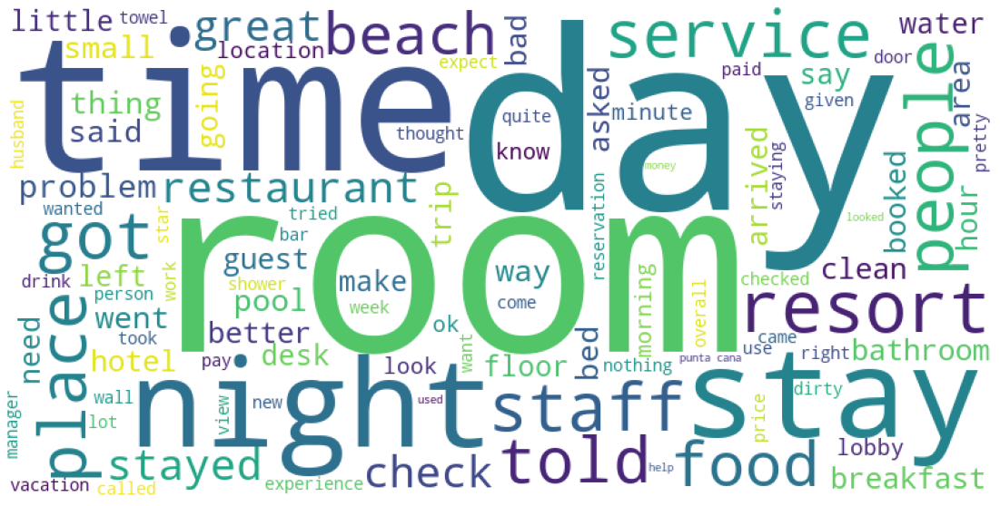

In [32]:
#Importing wordclound and matplotlib

from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

#Plotted a word cloud with the tokens.
allwords = ' '.join([x for x in lemmatized])
plt.figure(figsize=(20,10))
cloud = WordCloud(background_color = "white", max_words = 100,  stopwords = set(STOPWORDS), width=800, height=400)
cloud.generate(allwords)
plt.axis("off")
plt.imshow(cloud)
plt.show()

### Analyzing Negative Reviews (Based on polarity)

In [33]:
neg_2 = hotel[hotel.apply(lambda x: x['Polarity']<0, axis=1)]
neg_2

,Review,Rating,Review_length,Analysis(Rating),Subjectivity,Polarity,Analysis(Polarity)
13,nice hotel not nice staff hotel lovely staff q...,3.0,417,Positive,0.705556,-0.091667,Negative
40,"bad choice, booked hotel hot wire called immed...",1.0,861,Negative,0.578571,-0.027839,Negative
42,warwick bad good reviews warwick shocks staff ...,2.0,153,Negative,0.633333,-0.230000,Negative
44,"austin powers decor familiar, hotel seattlewhe...",2.0,268,Negative,0.533333,-0.043056,Negative
65,"hated inn terrible, room-service horrible staf...",1.0,133,Negative,0.725000,-0.633333,Negative
...,...,...,...,...,...,...,...
20352,mice room husband stayed museum hotel month st...,1.0,450,Negative,0.596970,-0.177273,Negative
20360,"disgusting stayed 1 night glad, room looked cu...",1.0,422,Negative,0.558673,-0.035374,Negative
20403,not check-out fast drove unappealing alley hot...,1.0,1057,Negative,0.594444,-0.002083,Negative
20421,worst sleep hip tooooo hip nite club building ...,1.0,342,Negative,0.650000,-0.242857,Negative


In [34]:
neg_2_str = [x.strip() for x in neg_2.Review ]
neg_2_str = ' '.join(neg_2_str)
neg_2_str

"nice hotel not nice staff hotel lovely staff quite rude, bellhop desk clerk going way make things difficult, waited forever check heavy bags no help getting throught double doors room, worst desk clerk checking tap tap tap car waited pick 20 minutes, got home noticed 1,000 dollar hold credit card took 5 phonecalls 2 faxes 1 week resolved, stay warwck 4th lenora rooms ok..but al friendly faces tiring day airport, bad choice, booked hotel hot wire called immediately requesting nonsmoking room king bed room away elevator/ice.the person spoke pleasant stated not guarantee requests honored make note reservation, check-in person desk rude said no special request noted reservation card andstated no king beds way reservation stuck 2 double beds, located directly accross elevator ice, nonsmoking, no elevator parking garage hotel, warwick mats garage filthy stairwells, hotel faces 4th smells urine, carpets registration elevator area need cleaning, upholstery curtains room needed cleaning andpre

In [35]:
tokens2 = word_tokenize(neg_2_str)
tokens2

['nice',
 'hotel',
 'not',
 'nice',
 'staff',
 'hotel',
 'lovely',
 'staff',
 'quite',
 'rude',
 ',',
 'bellhop',
 'desk',
 'clerk',
 'going',
 'way',
 'make',
 'things',
 'difficult',
 ',',
 'waited',
 'forever',
 'check',
 'heavy',
 'bags',
 'no',
 'help',
 'getting',
 'throught',
 'double',
 'doors',
 'room',
 ',',
 'worst',
 'desk',
 'clerk',
 'checking',
 'tap',
 'tap',
 'tap',
 'car',
 'waited',
 'pick',
 '20',
 'minutes',
 ',',
 'got',
 'home',
 'noticed',
 '1,000',
 'dollar',
 'hold',
 'credit',
 'card',
 'took',
 '5',
 'phonecalls',
 '2',
 'faxes',
 '1',
 'week',
 'resolved',
 ',',
 'stay',
 'warwck',
 '4th',
 'lenora',
 'rooms',
 'ok',
 '..',
 'but',
 'al',
 'friendly',
 'faces',
 'tiring',
 'day',
 'airport',
 ',',
 'bad',
 'choice',
 ',',
 'booked',
 'hotel',
 'hot',
 'wire',
 'called',
 'immediately',
 'requesting',
 'nonsmoking',
 'room',
 'king',
 'bed',
 'room',
 'away',
 'elevator/ice.the',
 'person',
 'spoke',
 'pleasant',
 'stated',
 'not',
 'guarantee',
 'requests',

In [36]:
stops_removed2 = [x for x in tokens2 if not x in stops]
stops_removed2

['staff',
 'lovely',
 'staff',
 'quite',
 'rude',
 'bellhop',
 'desk',
 'clerk',
 'going',
 'way',
 'make',
 'things',
 'difficult',
 'waited',
 'forever',
 'check',
 'heavy',
 'bags',
 'help',
 'getting',
 'throught',
 'double',
 'doors',
 'worst',
 'desk',
 'clerk',
 'checking',
 'tap',
 'tap',
 'tap',
 'car',
 'waited',
 'pick',
 '20',
 'minutes',
 'got',
 'home',
 'noticed',
 '1,000',
 'dollar',
 'hold',
 'credit',
 'card',
 'took',
 '5',
 'phonecalls',
 '2',
 'faxes',
 '1',
 'week',
 'resolved',
 'stay',
 'warwck',
 '4th',
 'lenora',
 'rooms',
 'ok',
 '..',
 'al',
 'friendly',
 'faces',
 'tiring',
 'day',
 'airport',
 'bad',
 'choice',
 'booked',
 'hot',
 'wire',
 'called',
 'immediately',
 'requesting',
 'nonsmoking',
 'king',
 'bed',
 'away',
 'elevator/ice.the',
 'person',
 'spoke',
 'pleasant',
 'stated',
 'guarantee',
 'requests',
 'honored',
 'make',
 'note',
 'reservation',
 'check-in',
 'person',
 'desk',
 'rude',
 'said',
 'special',
 'request',
 'noted',
 'reservation',


In [37]:
#lemmatization
lemmatized2 = [lemmatizer.lemmatize(x) for x in stops_removed2]

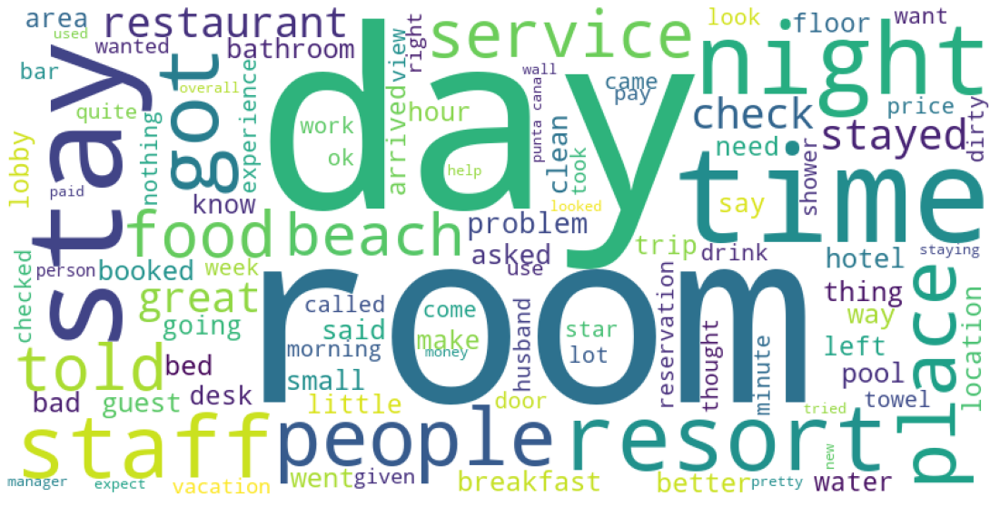

In [38]:
#Plotting a word cloud with the tokens.
allwords2 = ' '.join([x for x in lemmatized2])
plt.figure(figsize=(20,10))
cloud = WordCloud(background_color = "white", max_words = 100,  stopwords = set(STOPWORDS), width=800, height=400)
cloud.generate(allwords)
plt.axis("off")
plt.imshow(cloud)
plt.show()

### Analyzing the Positives 

In [39]:
pos_rev = hotel[hotel.apply(lambda x: x['Rating']>3, axis=1)]

In [40]:
pos_rev_str = [x.strip() for x in pos_rev.Review]
pos_rev_str = ' '.join(pos_rev_str)
pos_rev_str

"nice hotel expensive parking got good deal stay hotel anniversary, arrived late evening took advice previous reviews did valet parking, check quick easy, little disappointed non-existent view room room clean nice size, bed comfortable woke stiff neck high pillows, not soundproof like heard music room night morning loud bangs doors opening closing hear people talking hallway, maybe just noisy neighbors, aveda bath products nice, did not goldfish stay nice touch taken advantage staying longer, location great walking distance shopping, overall nice experience having pay 40 parking night, unique, great stay, wonderful time hotel monaco, location excellent short stroll main downtown shopping area, pet friendly room showed no signs animal hair smells, monaco suite sleeping area big striped curtains pulled closed nice touch felt cosy, goldfish named brandi enjoyed, did n't partake free wine coffee/tea service lobby thought great feature, great staff friendly, free wireless internet hotel wor

In [41]:
tokens3 = word_tokenize(pos_rev_str)
tokens3

['nice',
 'hotel',
 'expensive',
 'parking',
 'got',
 'good',
 'deal',
 'stay',
 'hotel',
 'anniversary',
 ',',
 'arrived',
 'late',
 'evening',
 'took',
 'advice',
 'previous',
 'reviews',
 'did',
 'valet',
 'parking',
 ',',
 'check',
 'quick',
 'easy',
 ',',
 'little',
 'disappointed',
 'non-existent',
 'view',
 'room',
 'room',
 'clean',
 'nice',
 'size',
 ',',
 'bed',
 'comfortable',
 'woke',
 'stiff',
 'neck',
 'high',
 'pillows',
 ',',
 'not',
 'soundproof',
 'like',
 'heard',
 'music',
 'room',
 'night',
 'morning',
 'loud',
 'bangs',
 'doors',
 'opening',
 'closing',
 'hear',
 'people',
 'talking',
 'hallway',
 ',',
 'maybe',
 'just',
 'noisy',
 'neighbors',
 ',',
 'aveda',
 'bath',
 'products',
 'nice',
 ',',
 'did',
 'not',
 'goldfish',
 'stay',
 'nice',
 'touch',
 'taken',
 'advantage',
 'staying',
 'longer',
 ',',
 'location',
 'great',
 'walking',
 'distance',
 'shopping',
 ',',
 'overall',
 'nice',
 'experience',
 'having',
 'pay',
 '40',
 'parking',
 'night',
 ',',
 'uni

In [42]:
stops = nltk.corpus.stopwords.words('english')
stops_extd = [',', "n't",'think']
stops.extend(stops_ex)
stops

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [43]:
stops_removed3 = [x for x in tokens3 if not x in stops]
stops_removed3

['expensive',
 'parking',
 'got',
 'deal',
 'stay',
 'anniversary',
 'arrived',
 'late',
 'evening',
 'took',
 'advice',
 'previous',
 'reviews',
 'valet',
 'parking',
 'check',
 'quick',
 'easy',
 'little',
 'disappointed',
 'non-existent',
 'view',
 'clean',
 'size',
 'bed',
 'comfortable',
 'woke',
 'stiff',
 'neck',
 'high',
 'pillows',
 'soundproof',
 'like',
 'heard',
 'music',
 'night',
 'morning',
 'loud',
 'bangs',
 'doors',
 'opening',
 'closing',
 'hear',
 'people',
 'talking',
 'hallway',
 'maybe',
 'noisy',
 'neighbors',
 'aveda',
 'bath',
 'products',
 'goldfish',
 'stay',
 'touch',
 'taken',
 'advantage',
 'staying',
 'longer',
 'location',
 'great',
 'walking',
 'distance',
 'shopping',
 'overall',
 'experience',
 'pay',
 '40',
 'parking',
 'night',
 'unique',
 'great',
 'stay',
 'wonderful',
 'time',
 'monaco',
 'location',
 'excellent',
 'short',
 'stroll',
 'main',
 'downtown',
 'shopping',
 'area',
 'pet',
 'friendly',
 'showed',
 'signs',
 'animal',
 'hair',
 'smel

In [44]:
#Lemmatization
lemmatized3 = [lemmatizer.lemmatize(x) for x in stops_removed3]

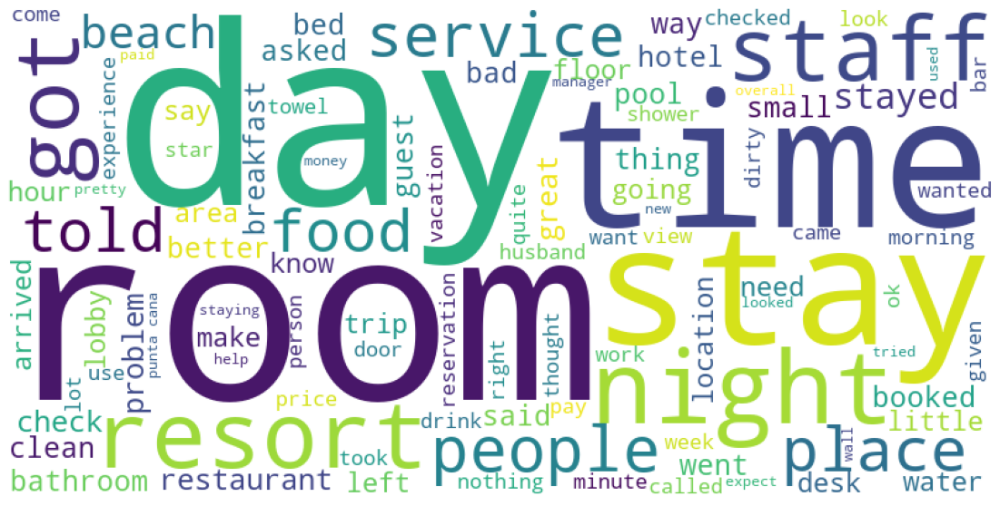

In [45]:
#Plotting a word cloud with the tokens.
allwords3 = ' '.join([x for x in lemmatized3])
plt.figure(figsize=(20,10))
cloud = WordCloud(background_color = "white", max_words = 100,  stopwords = set(STOPWORDS), width=800, height=400)
cloud.generate(allwords)
plt.axis("off")
plt.imshow(cloud)
plt.show()

## Classification with BERT 

In [46]:
hotel

,Review,Rating,Review_length,Analysis(Rating),Subjectivity,Polarity,Analysis(Polarity)
0,nice hotel expensive parking got good deal sta...,4.0,593,Positive,0.687000,0.208744,Positive
1,ok nothing special charge diamond member hilto...,2.0,1689,Negative,0.495009,0.214923,Positive
2,nice rooms not 4* experience hotel monaco seat...,3.0,1427,Positive,0.605208,0.294420,Positive
3,"unique, great stay, wonderful time hotel monac...",5.0,600,Positive,0.691228,0.504825,Positive
4,"great stay great stay, went seahawk game aweso...",5.0,1281,Positive,0.629396,0.384615,Positive
...,...,...,...,...,...,...,...
20486,"best kept secret 3rd time staying charm, not 5...",5.0,733,Positive,0.508586,0.221729,Positive
20487,great location price view hotel great quick pl...,4.0,306,Positive,0.622222,0.503704,Positive
20488,"ok just looks nice modern outside, desk staff ...",2.0,443,Negative,0.524304,0.171220,Positive
20489,hotel theft ruined vacation hotel opened sept ...,1.0,5557,Negative,0.533441,0.122573,Positive


In [47]:
df = hotel[['Review','Analysis(Rating)']]

#df.rename(columns={'Analysis(Rating)': 'Sentiment'}, inplace=True)

df

,Review,Analysis(Rating)
0,nice hotel expensive parking got good deal sta...,Positive
1,ok nothing special charge diamond member hilto...,Negative
2,nice rooms not 4* experience hotel monaco seat...,Positive
3,"unique, great stay, wonderful time hotel monac...",Positive
4,"great stay great stay, went seahawk game aweso...",Positive
...,...,...
20486,"best kept secret 3rd time staying charm, not 5...",Positive
20487,great location price view hotel great quick pl...,Positive
20488,"ok just looks nice modern outside, desk staff ...",Negative
20489,hotel theft ruined vacation hotel opened sept ...,Negative


In [48]:
df.rename(columns={'Analysis(Rating)': 'Sentiment'}, inplace=True)
df

C:\Users\hp\AppData\Local\Temp\ipykernel_33356\1177573280.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={'Analysis(Rating)': 'Sentiment'}, inplace=True)


,Review,Sentiment
0,nice hotel expensive parking got good deal sta...,Positive
1,ok nothing special charge diamond member hilto...,Negative
2,nice rooms not 4* experience hotel monaco seat...,Positive
3,"unique, great stay, wonderful time hotel monac...",Positive
4,"great stay great stay, went seahawk game aweso...",Positive
...,...,...
20486,"best kept secret 3rd time staying charm, not 5...",Positive
20487,great location price view hotel great quick pl...,Positive
20488,"ok just looks nice modern outside, desk staff ...",Negative
20489,hotel theft ruined vacation hotel opened sept ...,Negative


In [49]:
# encoding the labels

from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()
df['Sentiment'] = encoder.fit_transform(df['Sentiment'])
df

C:\Users\hp\AppData\Local\Temp\ipykernel_33356\2113858061.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Sentiment'] = encoder.fit_transform(df['Sentiment'])


,Review,Sentiment
0,nice hotel expensive parking got good deal sta...,1
1,ok nothing special charge diamond member hilto...,0
2,nice rooms not 4* experience hotel monaco seat...,1
3,"unique, great stay, wonderful time hotel monac...",1
4,"great stay great stay, went seahawk game aweso...",1
...,...,...
20486,"best kept secret 3rd time staying charm, not 5...",1
20487,great location price view hotel great quick pl...,1
20488,"ok just looks nice modern outside, desk staff ...",0
20489,hotel theft ruined vacation hotel opened sept ...,0


In [50]:
df['Sentiment'].value_counts()

1    17277
0     3214
Name: Sentiment, dtype: int64

In [51]:
# Performing train and test split

from sklearn.model_selection import train_test_split

In [52]:
x_train, x_test, y_train, y_test = train_test_split(df['Review'], df['Sentiment'], stratify=df['Sentiment'],test_size=0.20, random_state = 24)

In [53]:
y_train.value_counts()

1    13821
0     2571
Name: Sentiment, dtype: int64

## BERT 

In [54]:
pip install tensorflow-text 

  Using cached tensorflow_text-2.10.0-cp39-cp39-win_amd64.whl (5.0 MB)



In [55]:
pip install --ignore-installed --upgrade tensorflow 

  Using cached tensorflow-2.10.0-cp39-cp39-win_amd64.whl (455.9 MB)
  Using cached astunparse-1.6.3-py2.py3-none-any.whl (12 kB)
  Using cached keras-2.10.0-py2.py3-none-any.whl (1.7 MB)
  Using cached opt_einsum-3.3.0-py3-none-any.whl (65 kB)
  Using cached tensorboard-2.10.1-py3-none-any.whl (5.9 MB)
  Using cached termcolor-2.0.1-py3-none-any.whl (5.4 kB)
  Using cached Keras_Preprocessing-1.1.2-py2.py3-none-any.whl (42 kB)
  Using cached google_pasta-0.2.0-py3-none-any.whl (57 kB)
  Using cached libclang-14.0.6-py2.py3-none-win_amd64.whl (14.2 MB)
  Using cached flatbuffers-22.9.24-py2.py3-none-any.whl (26 kB)
  Using cached tensorflow_io_gcs_filesystem-0.27.0-cp39-cp39-win_amd64.whl (1.5 MB)
  Using cached gast-0.4.0-py3-none-any.whl (9.8 kB)
  Using cached absl_py-1.2.0-py3-none-any.whl (123 kB)
  Using cached tensorflow_estimator-2.10.0-py2.py3-none-any.whl (438 kB)
  Using cached tensorboard_data_server-0.6.1-py3-none-any.whl (2.4 kB)
  Using cached tensorboard_plugin_wit-1.8.1

ERROR: Could not install packages due to an OSError: [WinError 5] Access is denied: 'C:\\Users\\hp\\anaconda3\\Lib\\site-packages\\markupsafe\\_speedups.cp39-win_amd64.pyd'
Consider using the `--user` option or check the permissions.



In [56]:
# importing tensorflow libraries

import tensorflow as tf 
import tensorflow_hub as hub
import tensorflow_text as text

In [57]:
# importing BERT preprocessor and encoder.

bert_preprocessor = hub.KerasLayer("https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3")
bert_encoder = hub.KerasLayer("https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/4")

In [58]:
# Bert Layers

text_input = tf.keras.layers.Input(shape=(), dtype=tf.string, name='text')
preprocessed_text = bert_preprocessor(text_input)
outputs = bert_encoder(preprocessed_text)

# Importing optimizer

from tensorflow.keras.optimizers import Adam
opti = Adam(learning_rate=0.001)

# Neural Network layers

l1 = tf.keras.layers.Dropout(0.1, name = 'drpout_1')(outputs['pooled_output'])
l2 = tf.keras.layers.Dense(1, activation='sigmoid', name='output')(l1)

# Final model

model = tf.keras.Model(inputs=[text_input], outputs=[l2])

In [59]:
outputs['pooled_output']

<KerasTensor: shape=(None, 768) dtype=float32 (created by layer 'keras_layer_1')>

In [60]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 text (InputLayer)              [(None,)]            0           []                               
                                                                                                  
 keras_layer (KerasLayer)       {'input_mask': (Non  0           ['text[0][0]']                   
                                e, 128),                                                          
                                 'input_type_ids':                                                
                                (None, 128),                                                      
                                 'input_word_ids':                                                
                                (None, 128)}                                                  

In [61]:
METRICS = [
    tf.keras.metrics.BinaryAccuracy(name='Accuracy'),
    tf.keras.metrics.Precision(name='precision'),
    tf.keras.metrics.Recall(name='recall')
]

model.compile(optimizer=opti, loss = 'binary_crossentropy', metrics = METRICS)

In [65]:
model.fit(x_train, y_train, epochs=20)

Epoch 1/20
513/513 [==============================] - 4351s 8s/step - loss: 0.2757 - Accuracy: 0.8809 - precision: 0.8957 - recall: 0.9719
Epoch 2/20
513/513 [==============================] - 4213s 8s/step - loss: 0.2699 - Accuracy: 0.8867 - precision: 0.9010 - recall: 0.9725
Epoch 3/20
513/513 [==============================] - 4301s 8s/step - loss: 0.2692 - Accuracy: 0.8857 - precision: 0.9020 - recall: 0.9698
Epoch 4/20
513/513 [==============================] - 4166s 8s/step - loss: 0.2686 - Accuracy: 0.8858 - precision: 0.9019 - recall: 0.9701
Epoch 5/20
513/513 [==============================] - 4177s 8s/step - loss: 0.2658 - Accuracy: 0.8871 - precision: 0.9046 - recall: 0.9682
Epoch 6/20
513/513 [==============================] - 4177s 8s/step - loss: 0.2660 - Accuracy: 0.8868 - precision: 0.9051 - recall: 0.9671
Epoch 7/20
513/513 [==============================] - 4188s 8s/step - loss: 0.2646 - Accuracy: 0.8864 - precision: 0.9040 - recall: 0.9680
Epoch 8/20
513/513 [=======

In [66]:
model.evaluate(x_test, y_test)

129/129 [==============================] - 1096s 8s/step - loss: 0.2359 - Accuracy: 0.9041 - precision: 0.9172 - recall: 0.9742


[0.23589691519737244,
 0.9041229486465454,
 0.9171887636184692,
 0.9742476940155029]

### Saving the Model 

In [67]:
pip install pyyaml h5py

In [68]:
from tensorflow import keras

In [69]:
# Saving the model.

model.save('BERT.h5')

### Loading the Model

In [70]:
model = keras.models.load_model('./BERT.h5', custom_objects={'KerasLayer': hub.KerasLayer})

### Predicting with the Model 

In [72]:
y_pred = model.predict(x_test)

129/129 [==============================] - 1093s 8s/step


In [73]:
y_pred = np.round(y_pred)
y_pred

array([[1.],
       [0.],
       [1.],
       ...,
       [1.],
       [1.],
       [1.]], dtype=float32)

### Evaluating the Model 

In [74]:
from sklearn.metrics import classification_report

In [75]:
classification_report(y_test, y_pred)

'              precision    recall  f1-score   support\n\n           0       0.79      0.53      0.63       643\n           1       0.92      0.97      0.94      3456\n\n    accuracy                           0.90      4099\n   macro avg       0.85      0.75      0.79      4099\nweighted avg       0.90      0.90      0.90      4099\n'

In [76]:
from sklearn.metrics import accuracy_score, recall_score, f1_score, precision_score

print('Accuracy score of the model is:{:.2f}'.format(accuracy_score(y_test, y_pred)))
print('F1 Score of the model is:{:.2f}'.format(f1_score(y_test, y_pred)))
print('Precision score of the model is:{:.2f}'.format(precision_score(y_test, y_pred)))
print('Recall score of the model is:{:.2f}'.format(recall_score(y_test, y_pred)))

Accuracy score of the model is:0.90
F1 Score of the model is:0.94
Precision score of the model is:0.92
Recall score of the model is:0.97


Text(0.5, 1.0, 'Confusion Matrix')

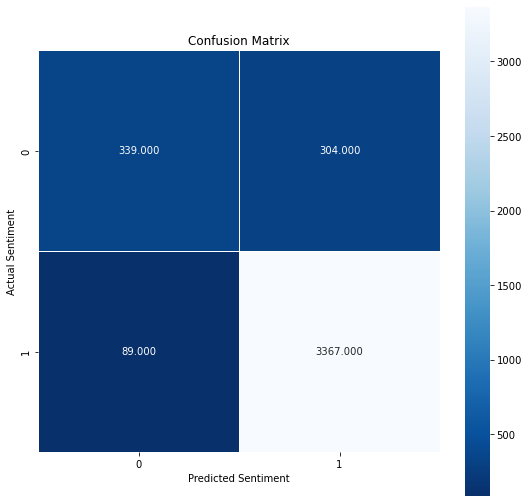

In [77]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(9,9))
sns.heatmap(cm, annot=True, fmt=".3f", linewidth=.5, square = True, cmap = 'Blues_r')
plt.ylabel('Actual Sentiment')
plt.xlabel('Predicted Sentiment')
plt.title('Confusion Matrix')

### Testing the Model 

In [78]:
text = [('The hotel stay was amzing. Had a great vacation.')]

In [79]:
model.predict(text)

1/1 [==============================] - 2s 2s/step


array([[0.98806727]], dtype=float32)

In [80]:
def classifier(text):
  result = model.predict(text)
  if result <0.5:
    return 'Negative'
  else:
    return 'Positive'

In [81]:
classifier(text)

1/1 [==============================] - 0s 464ms/step


'Positive'

### Testing on the Test data 

In [83]:
df_pred = pd.DataFrame(columns=['Sentiment'], data=y_pred)
df_pred

,Sentiment
0,1.0
1,0.0
2,1.0
3,1.0
4,1.0
...,...
4094,1.0
4095,1.0
4096,1.0
4097,1.0


In [85]:
review_df = pd.DataFrame(columns=['Review'], data=x_test).reset_index().drop(['index'],axis=1)
test_df = pd.concat([review_df, df_pred], axis=1)
test_df

,Review,Sentiment
0,loved littre just returned second visit deligh...,1.0
1,ok major problems got room hotwire guess ca n'...,0.0
2,excellent trip little kids wife just returned ...,1.0
3,perfect hotel booked stay west market street s...,1.0
4,lovely hotel not speak highly london bridge ho...,1.0
...,...,...
4094,nothing special not bad not great just ok. exp...,1.0
4095,fabulous experience hilton wife pleasure stayi...,1.0
4096,great stay just want say wife stayed week grea...,1.0
4097,"not expected arrived inn checked immediately, ...",1.0
